In [229]:
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sns


In [230]:
import os

In [231]:
df = pd.read_csv("netflix_titles.csv")

In [232]:
df.head(3)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...


In [233]:
df.shape

(8807, 12)

In [234]:
df.isna().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

In [235]:
df.dtypes

show_id         object
type            object
title           object
director        object
cast            object
country         object
date_added      object
release_year     int64
rating          object
duration        object
listed_in       object
description     object
dtype: object

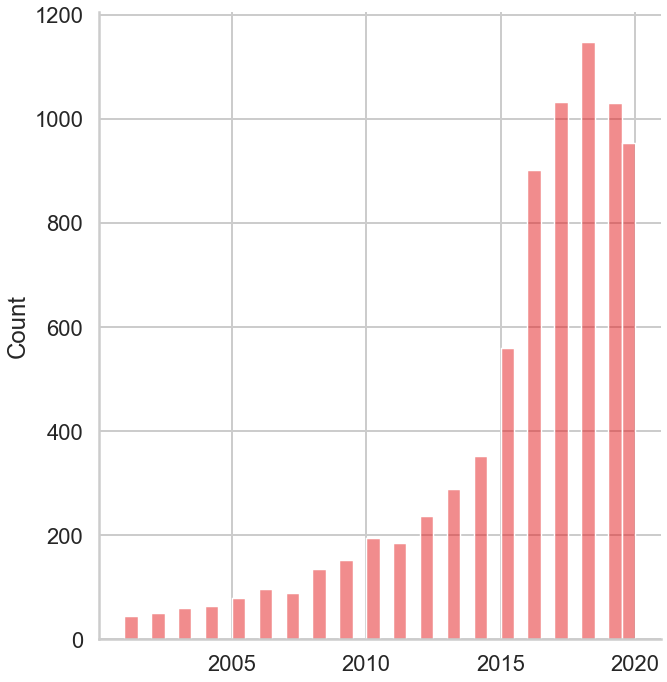

In [236]:
sns.set_style('whitegrid')
sns.set_context("poster")
g = sns.displot(df.query("release_year < 2021 and release_year > 2000 "), 
                palette = "Set1",
                height= 10,
            )

g._legend.remove()              

### Top 5 countries by films count

/Users/simonkunitsyn/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='country', ylabel='count'>

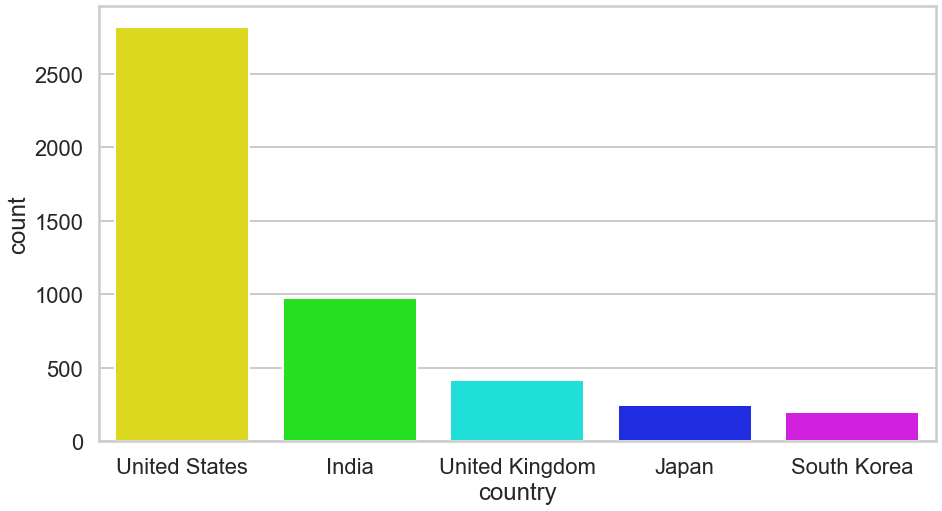

In [237]:
sns.set_style('whitegrid')
sns.set_context("poster")
plt.figure(figsize=(15,8))
sns.countplot(df.country, 
              order=df.country.value_counts().iloc[:5].index,
              palette = "hsv")






[Text(0, 0, 'Rajiv Chilaka'),
 Text(1, 0, 'Raúl Campos, Jan Suter'),
 Text(2, 0, 'Marcus Raboy'),
 Text(3, 0, 'Suhas Kadav'),
 Text(4, 0, 'Jay Karas')]

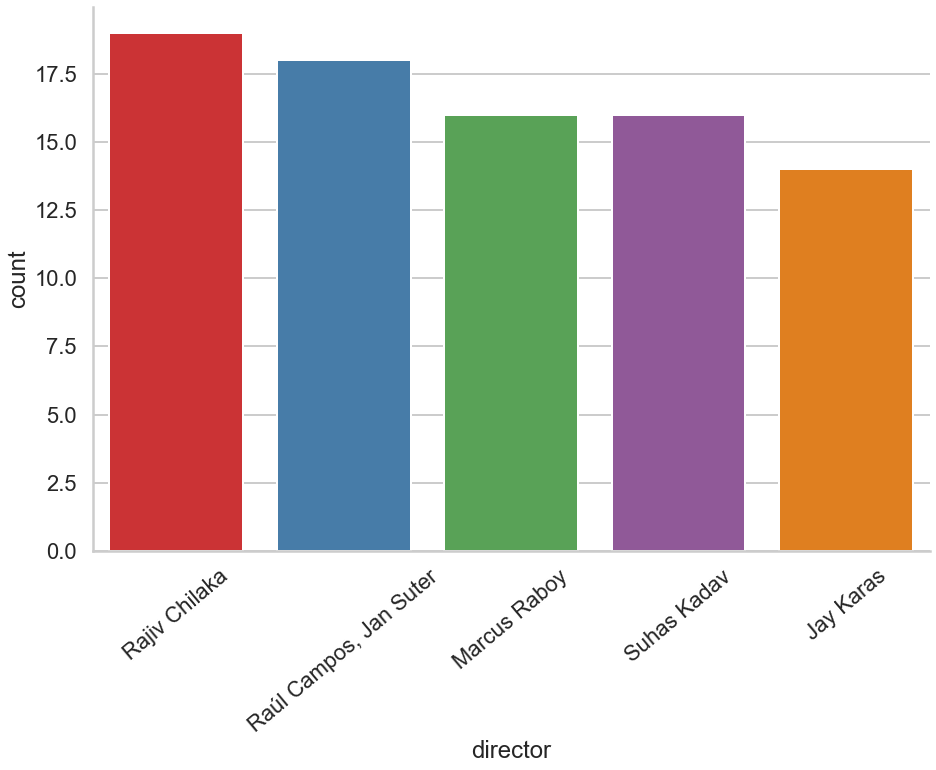

In [238]:
sns.set_context("poster")
plt.figure(figsize=(15,10))
g =  sns.countplot(x = 'director',
                   data = df,
                   order = df.director.value_counts().iloc[:5].index,
                   palette = "Set1",
                   #hue = "type"
                   
                  )
sns.despine()

g.set_xticklabels(df.director.value_counts().iloc[:5].index ,rotation=40
                 )



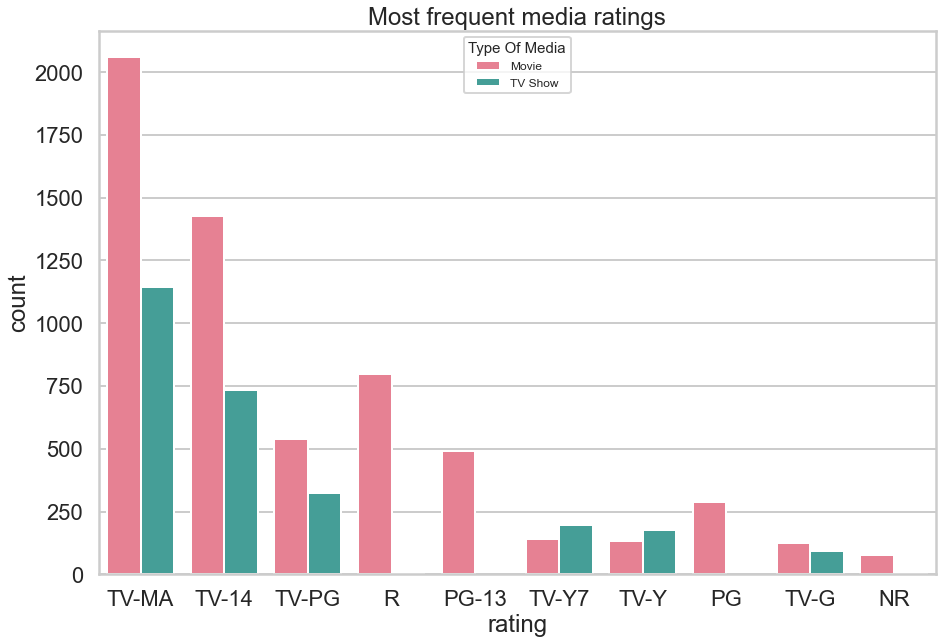

In [239]:
sns.set_style('whitegrid')
sns.set_context("poster")
plt.figure(figsize=(15,10))
sns.countplot(x = 'rating',
              data = df,
              order = df.rating.value_counts().iloc[:10].index,
             hue = 'type',
             palette = "husl")

plt.title("Most frequent media ratings")

plt.legend(loc='upper center', 
           fontsize= 12, 
           title= "Type Of Media", 
           title_fontsize = 15)

# converting all str to lowerCase

In [240]:
def converter(df):
    for i in (df.columns):
        df[i]=df[i].astype(str)
        df[i]=df[i].str.lower()
    return df

In [241]:
converter(df)
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,movie,dick johnson is dead,kirsten johnson,nan,united states,"september 25, 2021",2020,pg-13,90 min,documentaries,"as her father nears the end of his life, filmm..."
1,s2,tv show,blood & water,nan,"ama qamata, khosi ngema, gail mabalane, thaban...",south africa,"september 24, 2021",2021,tv-ma,2 seasons,"international tv shows, tv dramas, tv mysteries","after crossing paths at a party, a cape town t..."
2,s3,tv show,ganglands,julien leclercq,"sami bouajila, tracy gotoas, samuel jouy, nabi...",nan,"september 24, 2021",2021,tv-ma,1 season,"crime tv shows, international tv shows, tv act...",to protect his family from a powerful drug lor...
3,s4,tv show,jailbirds new orleans,nan,nan,nan,"september 24, 2021",2021,tv-ma,1 season,"docuseries, reality tv","feuds, flirtations and toilet talk go down amo..."
4,s5,tv show,kota factory,nan,"mayur more, jitendra kumar, ranjan raj, alam k...",india,"september 24, 2021",2021,tv-ma,2 seasons,"international tv shows, romantic tv shows, tv ...",in a city of coaching centers known to train i...


## Drop useless for future work columns

In [242]:
df = df.drop('date_added',axis = 1)
df =df.drop('show_id',axis = 1)
df =df.drop('rating',axis = 1)
df =df.drop('duration',axis = 1)

## Concat all rows in 1 column except "title"

In [243]:
df["descr"] = ""
def merger(x):
    for i in x.columns:
        df["descr"] +=df[i]+' '
    return df['descr']
merger(df.drop('title',axis = 1))

0       movie kirsten johnson nan united states 2020 d...
1       tv show nan ama qamata, khosi ngema, gail maba...
2       tv show julien leclercq sami bouajila, tracy g...
3       tv show nan nan nan 2021 docuseries, reality t...
4       tv show nan mayur more, jitendra kumar, ranjan...
5       tv show mike flanagan kate siegel, zach gilfor...
6       movie robert cullen, josé luis ucha vanessa hu...
7       movie haile gerima kofi ghanaba, oyafunmike og...
8       tv show andy devonshire mel giedroyc, sue perk...
9       movie theodore melfi melissa mccarthy, chris o...
10      tv show nan nan nan 2021 crime tv shows, docus...
11      tv show kongkiat komesiri sukollawat kanarot, ...
12      movie christian schwochow luna wedler, jannis ...
13      movie bruno garotti klara castanho, lucca pico...
14      tv show nan nan nan 2021 british tv shows, cri...
15      tv show nan logan browning, brandon p. bell, d...
16      movie pedro de echave garcía, pablo azorín wil...
17      tv sho

In [244]:
df.head()


,type,title,director,cast,country,release_year,listed_in,description,descr
0,movie,dick johnson is dead,kirsten johnson,nan,united states,2020,documentaries,"as her father nears the end of his life, filmm...",movie kirsten johnson nan united states 2020 d...
1,tv show,blood & water,nan,"ama qamata, khosi ngema, gail mabalane, thaban...",south africa,2021,"international tv shows, tv dramas, tv mysteries","after crossing paths at a party, a cape town t...","tv show nan ama qamata, khosi ngema, gail maba..."
2,tv show,ganglands,julien leclercq,"sami bouajila, tracy gotoas, samuel jouy, nabi...",nan,2021,"crime tv shows, international tv shows, tv act...",to protect his family from a powerful drug lor...,"tv show julien leclercq sami bouajila, tracy g..."
3,tv show,jailbirds new orleans,nan,nan,nan,2021,"docuseries, reality tv","feuds, flirtations and toilet talk go down amo...","tv show nan nan nan 2021 docuseries, reality t..."
4,tv show,kota factory,nan,"mayur more, jitendra kumar, ranjan raj, alam k...",india,2021,"international tv shows, romantic tv shows, tv ...",in a city of coaching centers known to train i...,"tv show nan mayur more, jitendra kumar, ranjan..."


In [245]:
x = pd.DataFrame(df.title)
x['descr'] = df['descr'].astype(str)
x.head()

,title,descr
0,dick johnson is dead,movie kirsten johnson nan united states 2020 d...
1,blood & water,"tv show nan ama qamata, khosi ngema, gail maba..."
2,ganglands,"tv show julien leclercq sami bouajila, tracy g..."
3,jailbirds new orleans,"tv show nan nan nan 2021 docuseries, reality t..."
4,kota factory,"tv show nan mayur more, jitendra kumar, ranjan..."


In [246]:
x['descr'] = x['descr'].str.replace('nan',"")
x['descr'] = x['descr'].str.replace(',',"")
x['descr'] = x['descr'].astype(str)

In [247]:
x['descr'].dtype

dtype('O')

In [248]:
import nltk
from nltk.tokenize import word_tokenize

In [249]:
x['tokenized_desc'] = x['descr'].apply(lambda x: "".join(x))

In [250]:
x

,title,descr,tokenized_desc
0,dick johnson is dead,movie kirsten johnson united states 2020 docu...,movie kirsten johnson united states 2020 docu...
1,blood & water,tv show ama qamata khosi ngema gail mabalane ...,tv show ama qamata khosi ngema gail mabalane ...
2,ganglands,tv show julien leclercq sami bouajila tracy go...,tv show julien leclercq sami bouajila tracy go...
3,jailbirds new orleans,tv show 2021 docuseries reality tv feuds fl...,tv show 2021 docuseries reality tv feuds fl...
4,kota factory,tv show mayur more jitendra kumar ranjan raj ...,tv show mayur more jitendra kumar ranjan raj ...
5,midnight mass,tv show mike flanagan kate siegel zach gilford...,tv show mike flanagan kate siegel zach gilford...
6,my little pony: a new generation,movie robert cullen josé luis ucha vanessa hud...,movie robert cullen josé luis ucha vanessa hud...
7,sankofa,movie haile gerima kofi ghanaba oyafunmike ogu...,movie haile gerima kofi ghanaba oyafunmike ogu...
8,the great british baking show,tv show andy devonshire mel giedroyc sue perki...,tv show andy devonshire mel giedroyc sue perki...
9,the starling,movie theodore melfi melissa mccarthy chris o'...,movie theodore melfi melissa mccarthy chris o'...


In [251]:
x['tokenized_desc']= x['tokenized_desc'].astype(str)

In [252]:
from sklearn.feature_extraction.text import CountVectorizer

In [253]:
cv = CountVectorizer(max_features = 5000, stop_words = "english", token_pattern = r'\b\w+\b')
matrix = cv.fit_transform(x['tokenized_desc'])

In [254]:
x.index.name = 'index'

In [255]:
x

,title,descr,tokenized_desc
index,,,
0,dick johnson is dead,movie kirsten johnson united states 2020 docu...,movie kirsten johnson united states 2020 docu...
1,blood & water,tv show ama qamata khosi ngema gail mabalane ...,tv show ama qamata khosi ngema gail mabalane ...
2,ganglands,tv show julien leclercq sami bouajila tracy go...,tv show julien leclercq sami bouajila tracy go...
3,jailbirds new orleans,tv show 2021 docuseries reality tv feuds fl...,tv show 2021 docuseries reality tv feuds fl...
4,kota factory,tv show mayur more jitendra kumar ranjan raj ...,tv show mayur more jitendra kumar ranjan raj ...
5,midnight mass,tv show mike flanagan kate siegel zach gilford...,tv show mike flanagan kate siegel zach gilford...
6,my little pony: a new generation,movie robert cullen josé luis ucha vanessa hud...,movie robert cullen josé luis ucha vanessa hud...
7,sankofa,movie haile gerima kofi ghanaba oyafunmike ogu...,movie haile gerima kofi ghanaba oyafunmike ogu...
8,the great british baking show,tv show andy devonshire mel giedroyc sue perki...,tv show andy devonshire mel giedroyc sue perki...


## See all titles

In [256]:
pd.set_option('display.max_rows', 10000)
x = pd.DataFrame(x.title.iloc[1:])
x

,title
index,
1,blood & water
2,ganglands
3,jailbirds new orleans
4,kota factory
5,midnight mass
6,my little pony: a new generation
7,sankofa
8,the great british baking show
9,the starling


# Start making predict

In [257]:
from sklearn.metrics.pairwise import cosine_similarity
similarity_matrix = cosine_similarity(matrix)

In [258]:
import random

In [259]:
matrix

<8807x5000 sparse matrix of type '<class 'numpy.int64'>'
	with 227626 stored elements in Compressed Sparse Row format>

In [260]:
def browse_titles(movie_input):
    movie_index = x[x["title"] == movie_input]["title"].index[0]
    movie_list = sorted(list(enumerate(similarity_matrix[movie_index])), key = lambda x:x[1], reverse = True)[1:50]
    Recc = []
    for movie in movie_list:
        Recc.append(x.iloc[movie[0]].title)
    random.shuffle(Recc)
    Recc = Recc[:5]
    return Recc

In [261]:
D = browse_titles("shaman king")
D = pd.DataFrame(D)
D

,0
0,the ghost bride
1,she-ra and the princesses of power
2,true: happy hearts day
3,kaake da viyah
4,romance is a bonus book
